Link to github repo: https://github.com/devmehta01/Divvy-Station-Placement-Optimization

Link to project report on github: https://github.com/devmehta01/Divvy-Station-Placement-Optimization/blob/main/Divvy_Project_Report.ipynb

Link to the datasets used: 

Divvy trips - https://data.cityofchicago.org/Transportation/Divvy-Trips/fg6s-gzvg

Divvy bicycle stations historical - https://data.cityofchicago.org/Transportation/Divvy-Bicycle-Stations-Historical/eq45-8inv

Divvy bicycle stations in service - https://data.cityofchicago.org/Transportation/Divvy-Bicycle-Stations-In-Service/67g3-8ig8

Chicago CTA Bus stations - https://data.cityofchicago.org/Transportation/CTA-Bus-Stops/hvnx-qtky

Chicago CTA Train stations - https://data.cityofchicago.org/Transportation/CTA-System-Information-List-of-L-Stops/8pix-ypme

#Introduction
The demand for Divvy bikes are increasing over the year and more and more users are being registered every day. Over 4 million rides were recorded in 2021, breaking the previous record of 3.81 million rides from 2019. Hence, this essentially means more users → more data → more scope for analysis.

We have obtained the data from sources jointly operated by Chicago Department of Transportation and Lyft. Divvy has a large network, and as the demand increases, it is important for the system to be efficient. So, we want to analyze the need of improvement in the existing system.

Our goal – To find problems with the current system and suggest strategies for improvement.

Our main data consists of historical station data and user trips data. The datasets are updated regularly, and we can expect the analysis to be highly relevant to the present and the foreseeable future.

Major Points of Focus 

- Bike availability 
- Station availability 

#Preprocessing 


## Dataset -- Divvy Trips

This dataset contains divvy trips data taken from the year 2018 to present. It tells us from which station a bike was taken and where the trip ended.

The datasets were segragated into different files. The data from before 2020 had different columns than the data after, so the first preprocessing step was to bring all the data under the same column names.

Next step was to impute the missing values namely the missing station names. These missing values are present because riders can park their bikes at locations other than the station. This imputing of values was done using a custom function that found the nearest station to the coordinates given in the row with the missing station name. 

Preprocessing the entire data took around 7 days. 

The code for the same can be found in this notebook - 

https://github.com/devmehta01/Divvy-Station-Placement-Optimization/blob/main/Trip%20Data%20EDA-Copy1.ipynb

##Dataset -- Divvy Stations
This dataset was downloaded on an annual time range from 2018-present to be able to process because it had data describing state of a station every 10 minutes across 1400+ Divvy stations.

The data was processed one file at a time and aggregated to hour-level, reducing the data by a factor of 6. Then records from 2018-present were compiled under one file for convenience.

##Dataset -- Divvy Bicycle Stations In Service, CTA bus stops, CTA train stops
This dataset consists of all the stations that are currently in service along with other details such as their latitude and longitude. We use the latitudes and longitudes from the divvy stations and compare them with the latitude and longitudes from the CTA bus and train stops and find the respective distances. These distances are used in the efficiency calculation.

## Location Categorization 

All the stations from the Divvy Station data have been classified into location types with the help of GeoPy library based on their co-ordinated

#EDA and Visualization 

## Comparing average bike availibility based on train station vicinity

We analyzed the average bike availibility across divvy stations based on their distance to their train station. Splitting the data into quantiles using distance and computing the average bike availibility throughout the day.

<div>
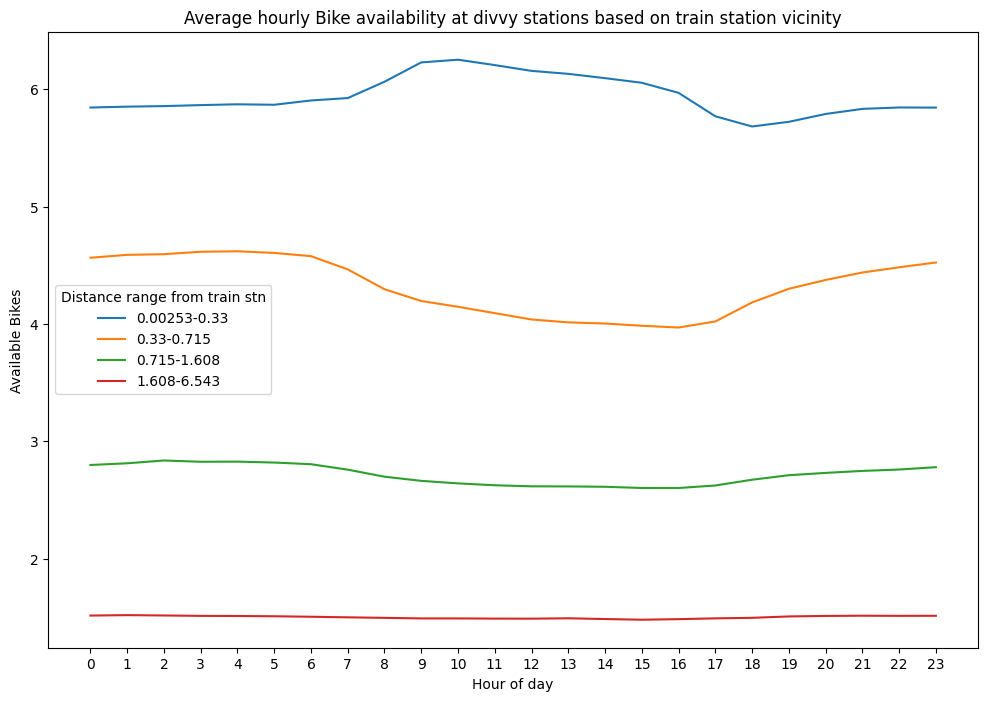
</div>

## Insights:

 

*   Divvy stations nearby train stations have more bikes available on an average throughout the day. This makes sense because people are less likely to take a divvy from a train station rather than dropping of bikes near a train station.
*   Also less bikes are likely to be dropped off at stations far away from train stations. These factors can be attributed to the bike availibility across these stations.




## Investigate geospatial information

We  need to analyize and understand the relation between the divvy station location and local area around it . In many cases divvy usage will be more where there is more population . Apart from that tourists destinations, restuartants and accessibilty from the nearest train and bus stop will also impact divvy station usage . Below we will find  communities with highest divvy  station usage and understand how locality is related to divvy usage.




1.   Community Area
2.   Nearest Bus/Train stop availabilty





<div>
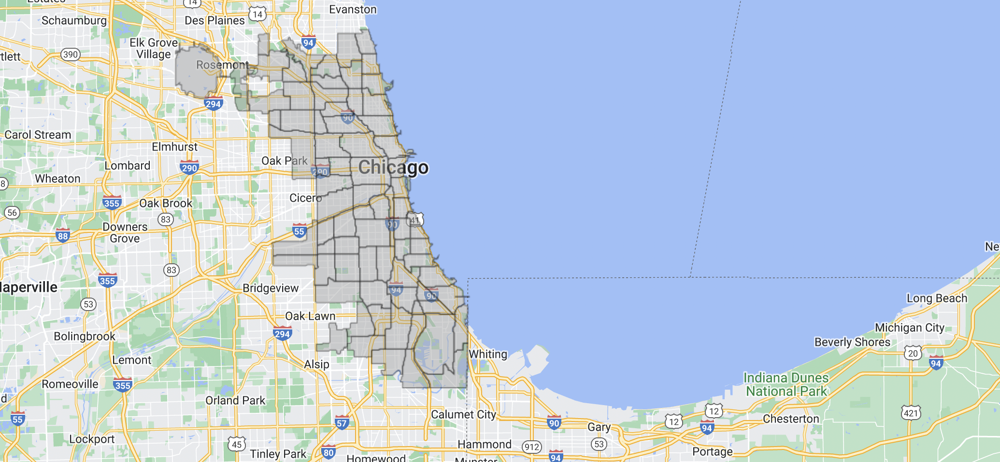
</div>

<div>
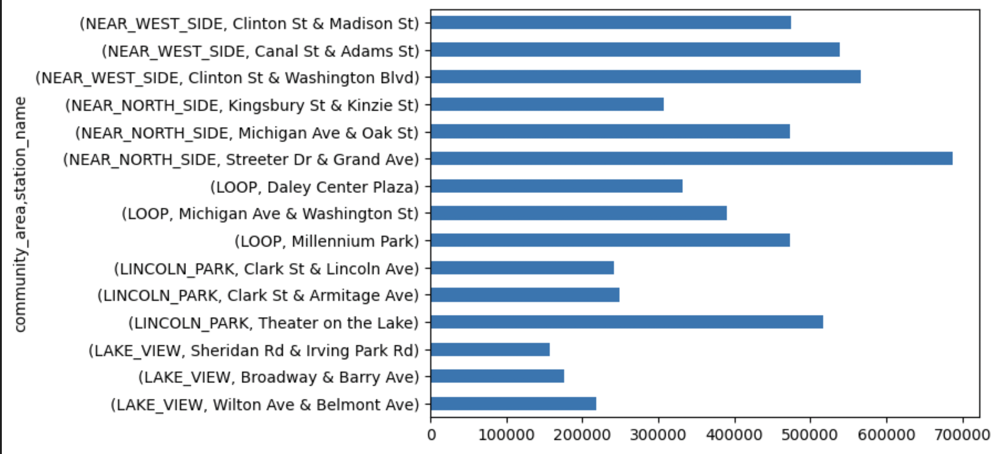
</div>

**Divvy Traffic Distrubution across Top 5 Community areas in Chicago**
  

*   Near West Side
*   Near North Side
*   Loop
*   Lincoln Park
*   Lake View

As we can see Top Community areas where Divvy is mostly used are in Downtown areas and the loop where companies, tourist attractions , restuartants reside . We can increase more stations and bikes in these community areas so that more people can access them.










<div>
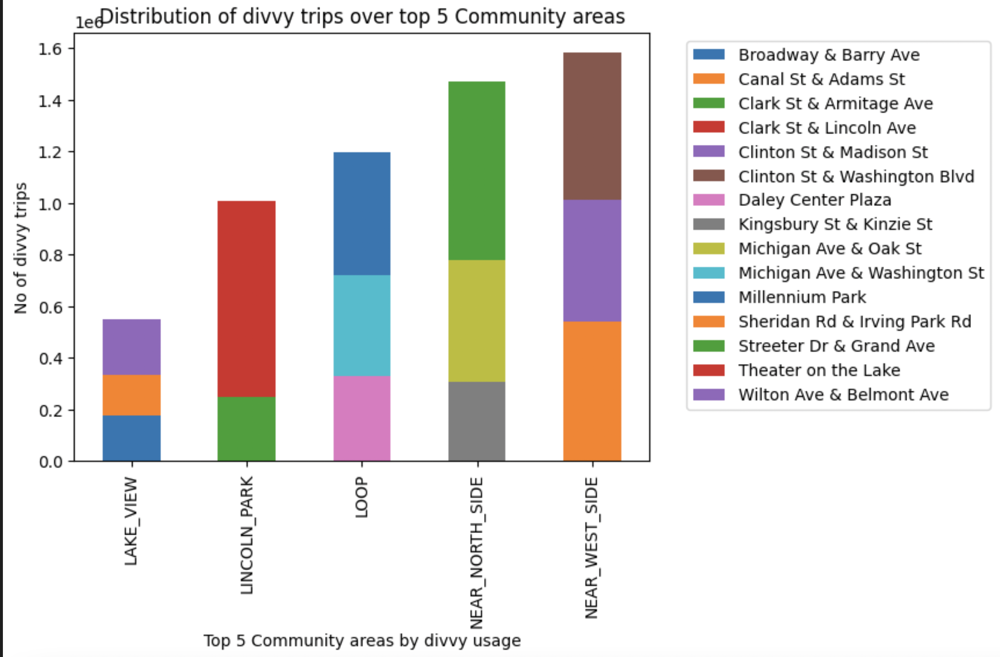
</div>

Found Nearest Bus and Train Station for every divvy station :

Divvy Station should be placed optimally so that it can be accessible easily .Below code finds nearest bus and train station of each station and we can use this data and pass as one the parameter to our ML model .

https://github.com/devmehta01/Divvy-Station-Placement-Optimization/blob/main/FindBusiestStation.ipynb

## Dataset -- Divvy Trips

A set of bar graphs were created that showed the top 5 most used stations in over the time period spanning 2018 to the present.
The results are below - 

<div>
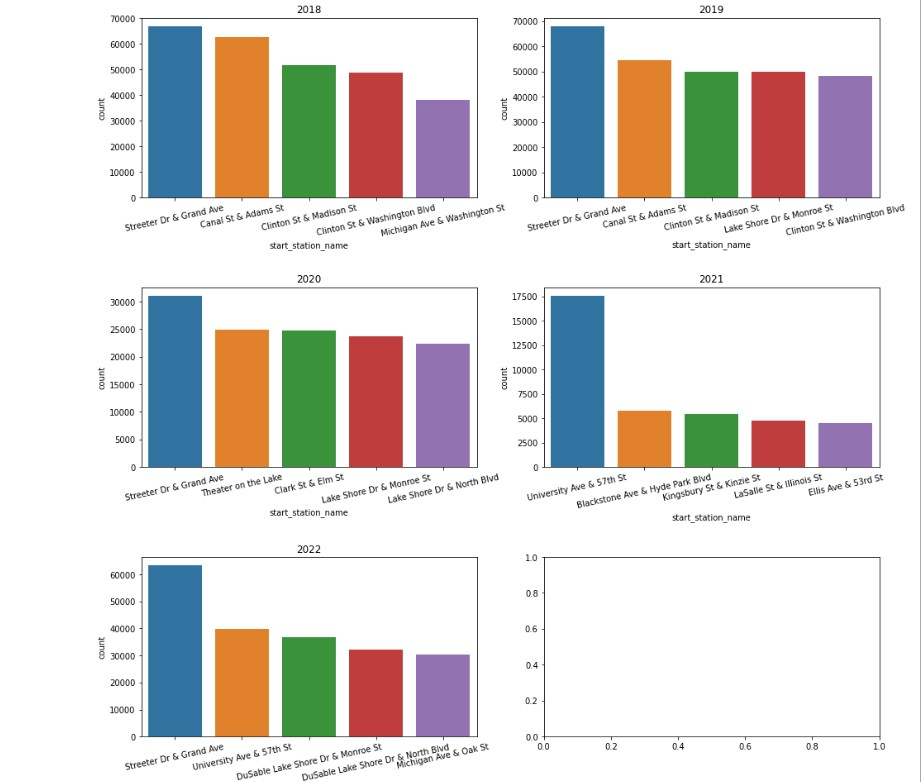
</div>

To identify the current efficiency of the system the stations were plotted in the graph using the coordinates in the dataset and the points were colored acording to the station activity since 2018. As it can be seen, most stations were rarely used over the last 4 years the ones that are highly used are concentrated in a small area of chicago. It can be advised to relocate certain stations to the area with higher demand and reduce the number of stations in areas with low demand. 
The results are below - 

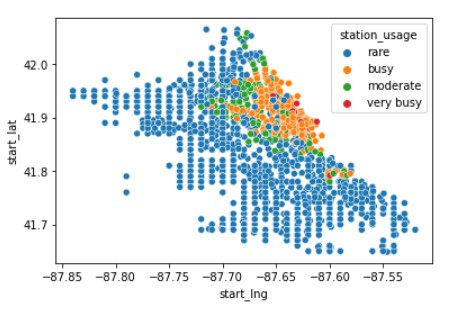

The link to the code can be found here - 
https://github.com/devmehta01/Divvy-Station-Placement-Optimization/blob/main/Trip%20Data%20EDA-Copy1.ipynb

## Dataset - Divvy Stations 

Station distribution can be viewed through view.html that was created using folium library. 



<div>
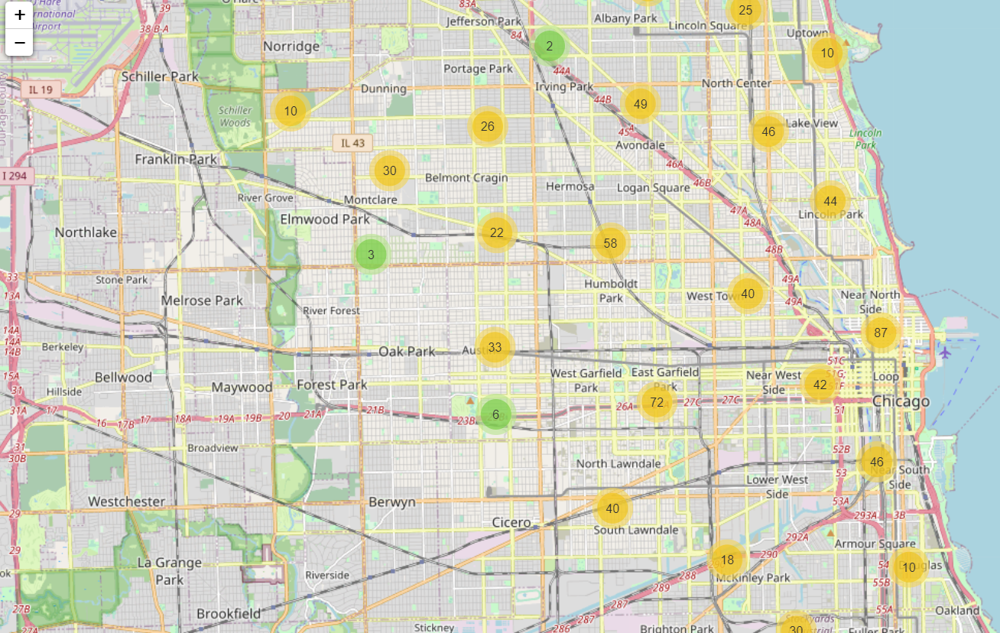
</div>

#Analysis using Machine Learning - 1: Clustering

##Task:
1. Display all divvy stations that are currently in service.
2. Make an interactive plot/visualization that shows the location of these stations on a map.
3. Perform K Means clustering on these points using the distance between the stations as the metric.
4. Create a new column in the dataset for clusters and assign the values of clusters to the stations.
5. Create an interactive plot/visualization that shows the location of these stations along with which cluster they belong to.

##Use case:
Our main goal is to improve accuracy of the divvy ecosystem as a whole. However, if we try to evaluate the efficiency of all stations together, before and after our improvements, the results would not be quite indicative of the improvement since Chicago is a large city. For this reason, we came up with the idea of splitting the stations into multiple regions. The reason why we have performed clustering on these stations is so that we have separate regions to work with and we can show analysis for the efficiency and the suggestions for new stations based on these regions rather than Chicago as whole. The task of splitting the stations into regions is an unsupervised task as we do not have the number of regions. Hence we decided to cluster these stations using distance as the metric.

##Analysis:
1. All stations currently in service have been displayed.
2. All stations currently in service have been plotted interactively.
3. K Means clustering has been performed on all stations for different values and the optimal value of K has been decided by our knowledge of the areas in Chicago and using our eye as judge. (We tried the elbow method and it shows that the inertia/error becomes flattened after about 5 clusters. However, this did not seem right to us and hence we decided to try various values for K and we decided on the value 25 as it was able to separate Chicago perfectly into various regions such as UIC, Downtown, West Loop, Illinois Tech, UofChicago, etc.)
4. The stations after clustering have been plotted interactively.

Note: Since there are interactive plots, they will not be visible on github. The original interactive plots for the below plots can be seen by going to the [Colab file](https://colab.research.google.com/drive/1vtdAJQ0Mbzv0w29x9y3TAKjx-O-GRedx?usp=sharing)

Plot of all Divvy stations in Chicago:
<div>
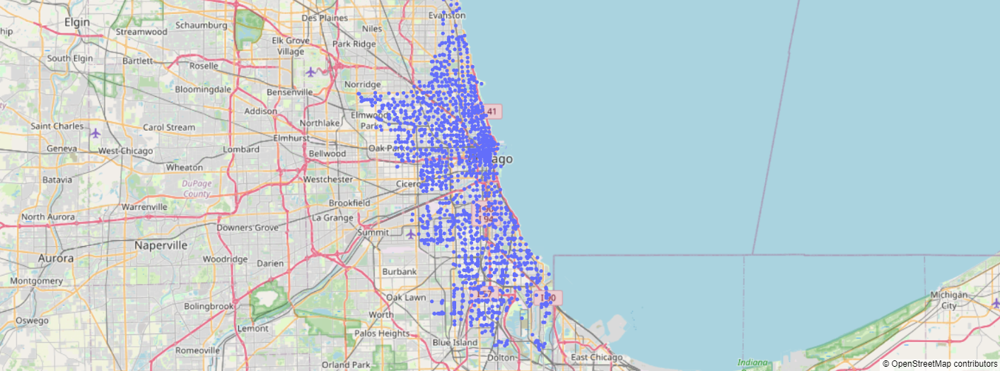
</div>

Plot of all Divvy stations in Chicago after segregating into different regions using clustering:
<div>
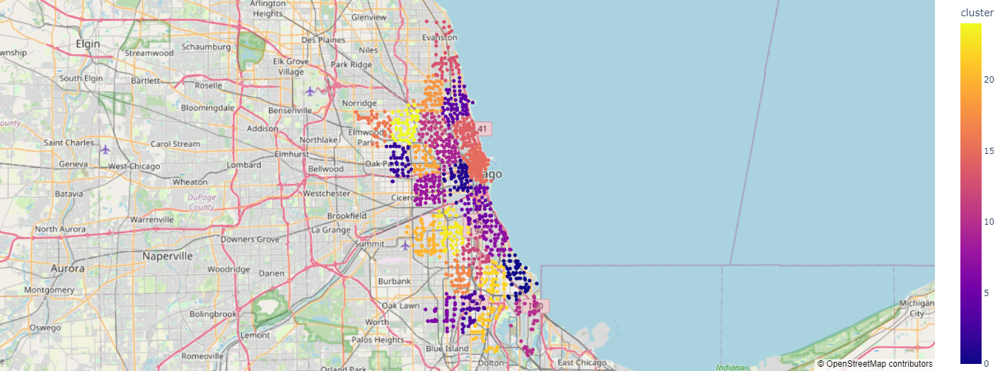
</div>

# Efficiency Calculation

##Task:
Calculate efficiency of the stations based on the following features:

1. Distance from nearest bus station
2. Distance from nearest train station
3. Distance to the 3 nearest divvy stations
4. Supply vs demand of the bikes at the stations


##Use case:
Once we have the efficiency of each of the stations, we can then use this information to identify which stations need improvement. We also calculate the efficiency of clusters/regions to understand which regions are the least efficient so that focus can be diverted towards stations in those clusters/regions.

##Analysis:
1. We were able to write an algorithm to calculate efficiency by giving certain weights (importance) to each features.
2. We then scale the efficiency so that we can obtain a value between 0 & 1

We found the mean and median values of the efficiency of all stations and then selected a threshold to segregate them into efficient and inefficient stations.

We realize that the weights that we have assigned are prone to bias. For this reason, we took a consensus among all the team members and decided upon particular values for the weights based on the importance of the features.

## Math behind Efficiency Calculation

Efficiency (E)  =  bus_wt * bus_dist + train_wt * train_dist + ratio_wt * supply_demand_ratio + Σ(div_st_wt * div_st_dist)

- Efficiency of individual stations -> Efficiency for each cluster (aggregate) & region-wise efficiency was calculated.
- The data was sorted based on the final efficiencies of the cluster and based on the need (could be based on budget allocation) we can pinpoint the number of stations that need improvement or if newer stations need to be added. 
- After doing that, efficiencies can again be calculated for that specific cluster or region to make sure that it surpasses the minimum threshold. 

The code and the output table can be found in the following [notebook](https://github.com/devmehta01/Divvy-Station-Placement-Optimization/blob/main/divvy_final_efficiency.ipynb)

# Analysis using Machine Learning - 2: Demand Forecasting

## Task:
1. Perform EDA to analyze the following:
    
    a. What is the yearly trend in renting bikes. (That is, comparing data over the years, is the demand increasing, decreasing or remaining the same?)
    
    b.What is the seasonal trend in renting bikes. (That is, in a given year, what season has the highest demand and what season has the lowest demand.)
    
    
2. Create a Time-Series model that can predict the daily demand of bikes for how many ever days we want.

We aim to answer the following questions:

1. What do you think will be the yearly trend? That is, from 2018 to 2022.
2. What do you think will be the seasonal trend? That is, from January to December.
3. What do you expect the for the future? That is, for 2023 and onwards.

## Use case:
Using the yearly and seasonal trend, we can create a time-series model that can predict the demand for the future. After we predict the demand for the future, this information can be used to compare the supply and see if more bikes or stations are needed to meet the future demand. Demand forecasting paired with efficiency gives us a strong way to improve the Divvy ecosystem.

## Analysis:
1. For the yearly trend, I had expected that the use and demand of divvy will keep increasing over the years. I had also expected that the demand for divvy will be lower than the normal during 2020 and 2021 due to covid. From my analysis, this is exactly what I got to see. The peaks were continuously increasing over the years from 2018 to 2022 and 2020 did not peak due to covid.

2. For the seasonal trend, I had expected the demand to be low from January to March, it would increase and peak towards July-August, and then again start going down as December approaches. From my analysis, this is exactly what we got to see. The demand is low in the winter months due to snow, and it peaks in July.

3. We created a time-series model using prophet in order to make predictions for the future days. There is a parameter called periods using which you can set for how many days in the future do you want a prediction. We currently set the value to 365 to get a prediction for the next 1 year. From the predictions for the next year, we see that it accurately represents the demand for the future based on the past data. After making the prediction for the next 1 year, we see that it accurately represents the demand for the future based on the past data. We also tried making predictions for the next 4 years to see if the gap due to COVID would have an effect on the predictions, and it did not, so we can say that the model is not sensitive to outliers, which is a good thing.

4. We had tried to use multiple models (ARIMA, SARIMAX, auto-arima, and Prophet) to perform demand forecasting, but ARIMA, SARIMAX and auto-arima did not give good results. The Prophet model worked really well.

### Seasonal Trend (January to December)
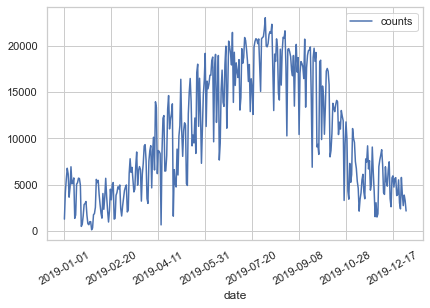

As expected, demand is low in the winters and high in the summers, peaking in July.

### Yearly trend (2018 to 2022)
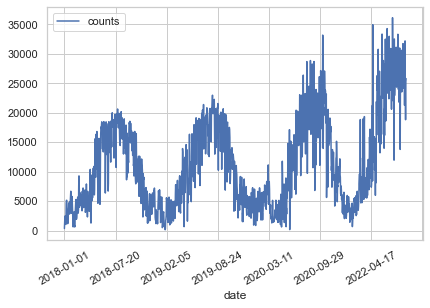

The data also followed the expected trend of going up every year, except for 2020, since divvy was shut down from early 2020 to late 2021.

### Trained Prophet model
<div>
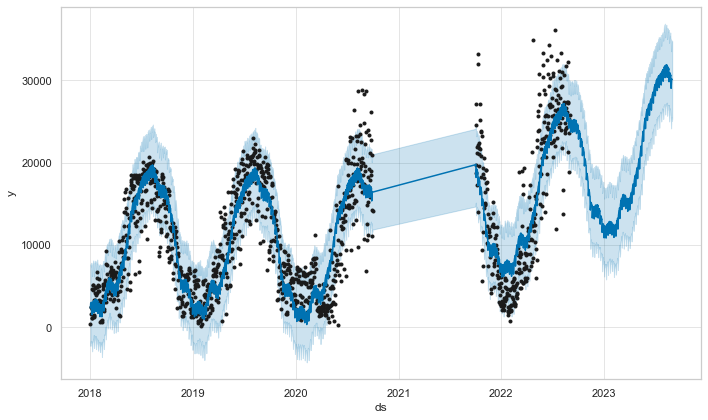
</div>

This is our fitted model making predictions for the next year. We can see that it fits the data really well and is able to make predictions for the next year really well too. We also tried making predictions for the next 4 years to see if the gap due to COVID would have an effect on the predictions, and it did not, so we can say that the model is not sensitive to outliers, which is a good thing. The model that we used was Facebook's Prophet model. We also tried using other famous models such as ARIMA, SARIMAX, and auto-arima, but they did not give us good predictions. We also made an interactive plot such that when you hover over the graph, it would give you the prediction for that month, and if you zoom in, it would become more granular such that you would be able to see the prediction for each day. So because of this graph, you won’t need to worry about a code to find the prediction for each day or month.



The interactive plot can be found in the following [notebook](https://colab.research.google.com/drive/1FSJrlYvH-XySctrUjAIMWElHE5e7iPht). You will not need to run the code again since I have already run it and you will be able to see the output.

The interactive plots will look like this:

<div>
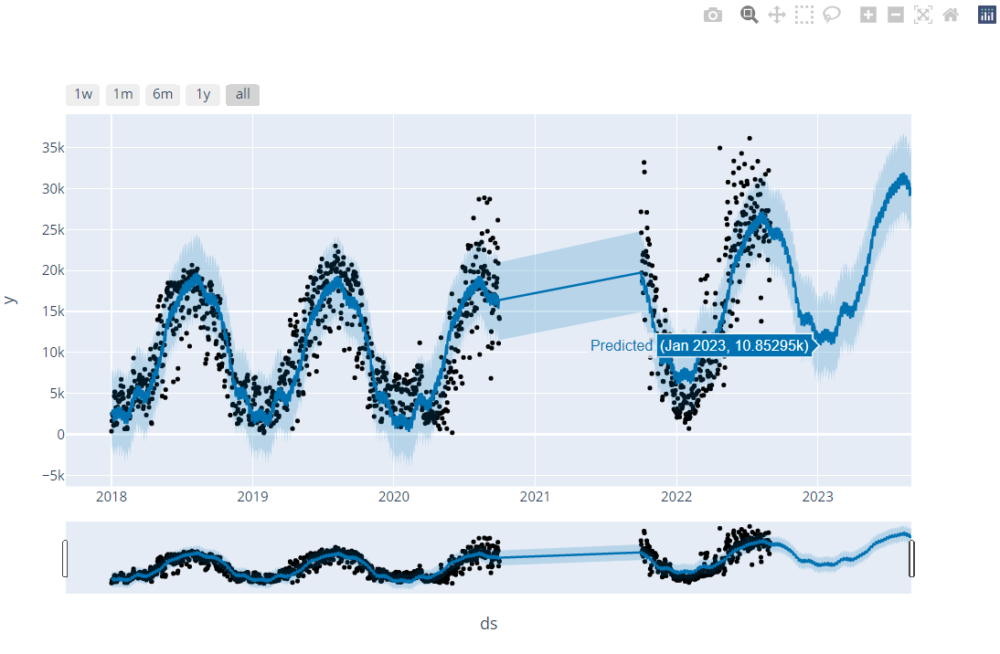
</div>

<div>
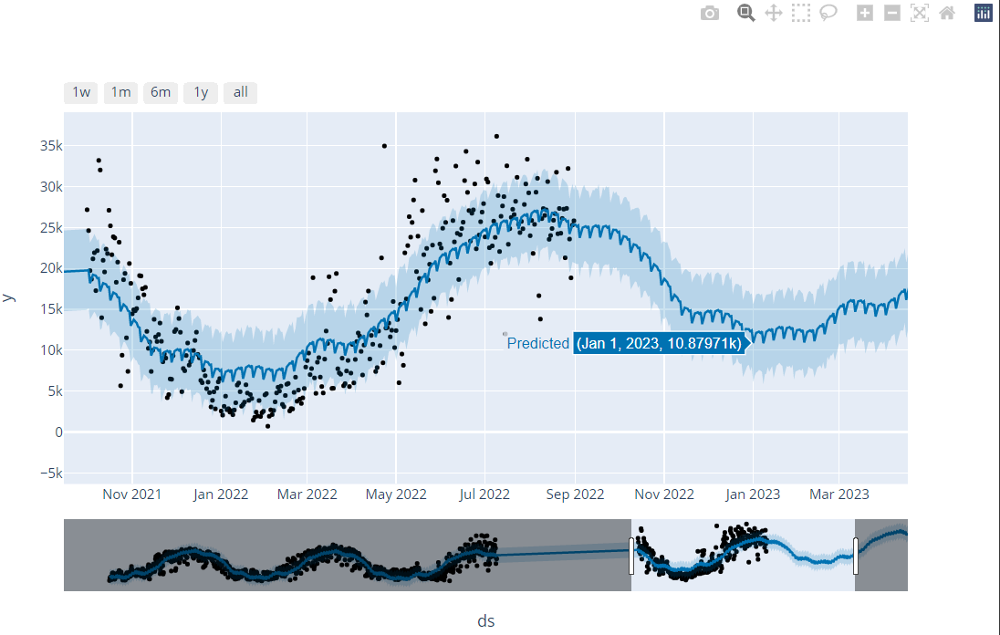
</div>

Some other graphs which show the general yearly trend, seasonal trend and the day of the week compared with the busyness.

<div>
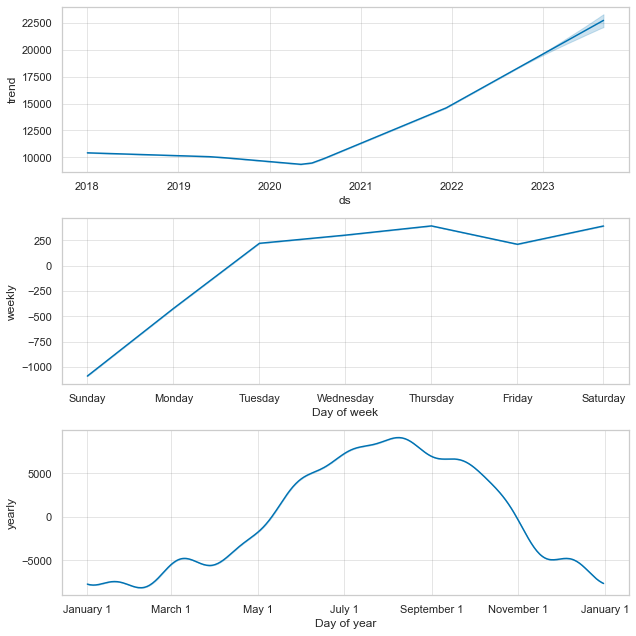
</div>

#Reflection:
Challenges:
1. One of the most challenging part of the project is handling such large amounts of data. We do not have enough computing power to work on so much data at once, hence we had to divide the data into multiple parts and then work on it separately.
2. Computing power and resources were a major bottleneck during this project as the preprocessing consisted of almost 7 million * 1613 computations.

Insights:
1. From the map it can be seen that most divvy stations are underutilized in the current setup. This calls for relocation or closure of these stations.
2. Chicago can be divided into 25 different regions
3. Most busy stations are those near the downtown and university areas, while least used stations are more towards the outskirts as expected.
4. Analyzing the current efficiency of stations, it shows that many stations are inefficient (far from bus and train stations, not near other divvy stations, and supply not meeting the demand).
5. From the seasonal trend we can see that the demand is highest in summers and lowest in the winters. We can also see that the demand is increasing over the years. 